In [1]:
import matplotlib.pyplot as plt
%matplotlib inline

import os #환경 변수 및 디렉터리, 파일 등 OS자원을 제어할 수 있게 해주는 모듈
from glob import glob #특정 디렉토리에 있는 파일들을 리스트로 제어

#https://docs.opencv.org/master/da/df6/tutorial_py_table_of_contents_setup.html
#이미지 처리를 위한 OpenCV모듈

import cv2

## 1. Image Load
<br>
  
cv2.imread(path, image유형)로 이미지를 불러온다. 
openCV는 이미지 데이터를 RGB가 아닌 BGR 순서로 불러오므로 순서를 바꿔줄 필요가 있다.


* cv2.cvtColor(image, colorversion code)
* 여기서 conversion code는 COLOR_BGR2RGB 사용

많은 종류의 conversion code가 있음: https://docs.opencv.org/4.5.2/d8/d01/group__imgproc__color__conversions.html#ga397ae87e1288a81d2363b61574eb8cab

<br>

In [9]:
#image파일 하나 불러와보기
temp = cv2.cvtColor(cv2.imread(r"C:\Users\Public\state-farm-distracted-driver-detection\imgs\train\c0\img_292.jpg", cv2.IMREAD_COLOR),cv2.COLOR_BGR2RGB)
temp

array([[[ 57,  74,  64],
        [ 56,  73,  63],
        [ 55,  72,  62],
        ...,
        [ 15,  18,   7],
        [ 33,  34,  26],
        [ 61,  62,  56]],

       [[ 55,  72,  62],
        [ 55,  72,  62],
        [ 54,  71,  61],
        ...,
        [ 40,  43,  32],
        [  9,  10,   4],
        [  3,   4,   0]],

       [[ 53,  70,  60],
        [ 52,  69,  59],
        [ 52,  69,  59],
        ...,
        [209, 210, 202],
        [112, 113, 107],
        [ 43,  44,  39]],

       ...,

       [[  6,   6,   4],
        [  6,   6,   4],
        [  6,   6,   4],
        ...,
        [ 12,  11,   9],
        [ 11,  10,   8],
        [ 11,  10,   8]],

       [[  6,   6,   4],
        [  6,   6,   4],
        [  6,   6,   4],
        ...,
        [ 11,  10,   8],
        [ 11,  10,   8],
        [ 11,  10,   8]],

       [[  6,   6,   4],
        [  6,   6,   4],
        [  6,   6,   4],
        ...,
        [ 11,  10,   8],
        [ 11,  10,   8],
        [ 12,  11,   9]]

In [13]:
len(temp)

480

**오류 발생 사례**
>Error : src.emtpy() in function ...


원래 지정되어 있던 directory path 중 사용자 폴더명에 한글이 있어 오류 발생
* 해결방법: 사용자 이름 폴더에서 public폴더로 위치를 옮겨서 작업


주로 해당 오류가 나는 이유:
* 경로중 한글명이 있다. 
* 파일 끝에 확장자 명이 없다. 
* 확장자가 잘못되었다. 

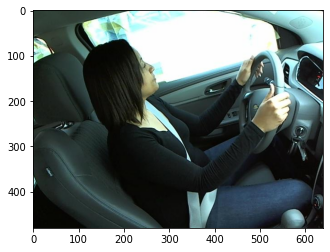

In [19]:
#이미지 시각화
plt.imshow(temp)

In [15]:
def read_image(path):
    image = cv2.imread(path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

In [1]:
# 이미지 파일 경로를 지정한다

#모든 이미지 파일은 data_dir경로에 지정되어 있다.
data_dir = r"C:/Users/Public/state-farm-distracted-driver-detection/imgs/"

train_path = data_dir + 'train/imgs/c0/'
test_path = data_dir + 'test/'
filename = 'img_34.jpg'


In [2]:
path= train_path+filename
path

'C:/Users/Public/state-farm-distracted-driver-detection/imgs/train/imgs/c0/img_34.jpg'

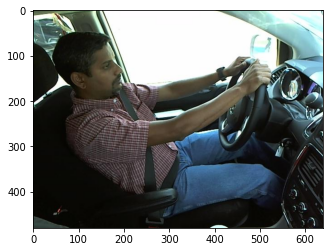

In [22]:
# 이미지 데이터 읽어오기
image = read_image(path)

# 이미지 시각화
plt.imshow(image)

In [24]:
# 훈련 데이터 클래스 

labels = ['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']
labels_text = {
    'c0': 'normal driving',
    'c1': 'texting - right',
    'c2': 'talking on the phone - right',
    'c3': 'texting - left',
    'c4': 'talking on the phone - left',
    'c5': 'operating the radio',
    'c6': 'drinking',
    'c7': 'reaching behind',
    'c8': 'hair and makeup',
    'c9': 'talking to passenger',
}


In [26]:
labels

['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']

In [30]:
labels_text['c0']

'normal driving'

In [84]:
#r원시문자열: 백슬래시(\)를 해석하지 않음 - 경로 등 사용에 유용
# glob에서 {}은 format함수의 인자들로 대체됨
#왜 \\이 두 번 표기되지? 그리고 for문 돌릴때는 왜 정상작동하지? 

glob(r'{}/train/{}/*.jpg'.format(data_dir, label))[:5]

['C:/Users/Public/state-farm-distracted-driver-detection/imgs//train/c9\\img_100090.jpg',
 'C:/Users/Public/state-farm-distracted-driver-detection/imgs//train/c9\\img_100100.jpg',
 'C:/Users/Public/state-farm-distracted-driver-detection/imgs//train/c9\\img_100190.jpg',
 'C:/Users/Public/state-farm-distracted-driver-detection/imgs//train/c9\\img_100286.jpg',
 'C:/Users/Public/state-farm-distracted-driver-detection/imgs//train/c9\\img_100294.jpg']

In [237]:
len(files[:])

2129

In [241]:
import random
random.randint(0,len(files[:])+1)

1867

				# c0 : normal driving


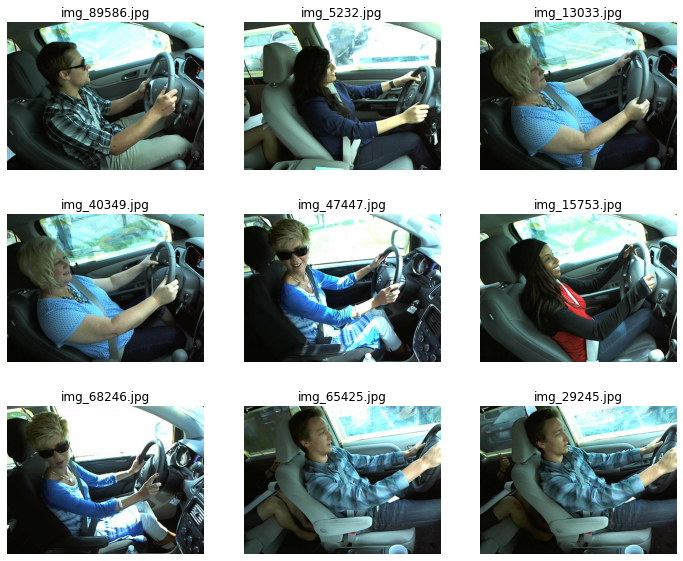

				# c1 : texting - right


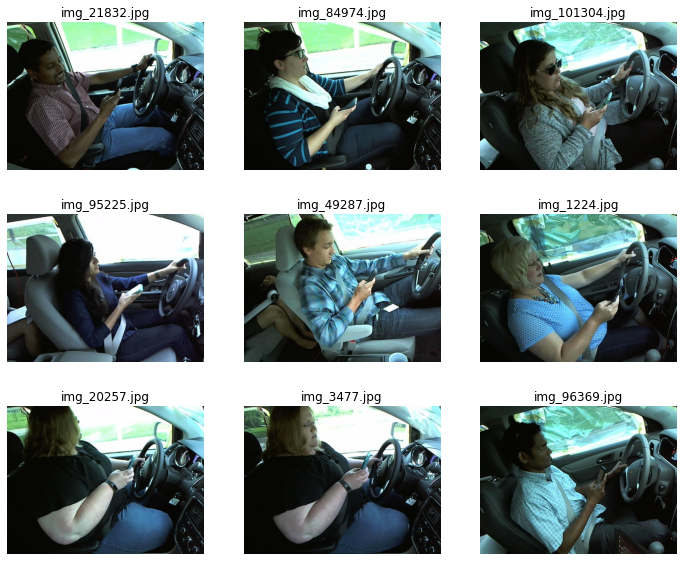

				# c2 : talking on the phone - right


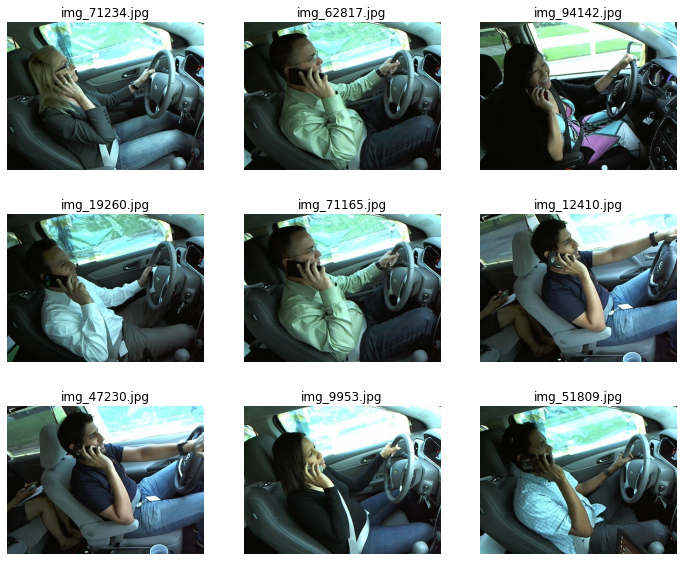

				# c3 : texting - left


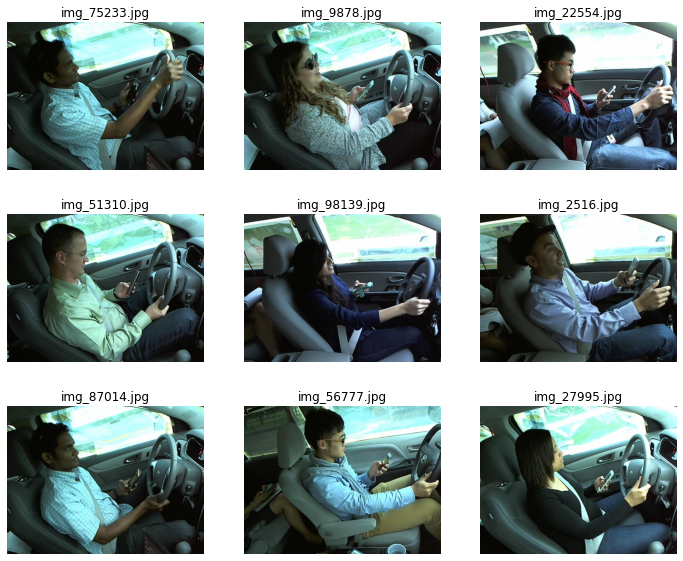

				# c4 : talking on the phone - left


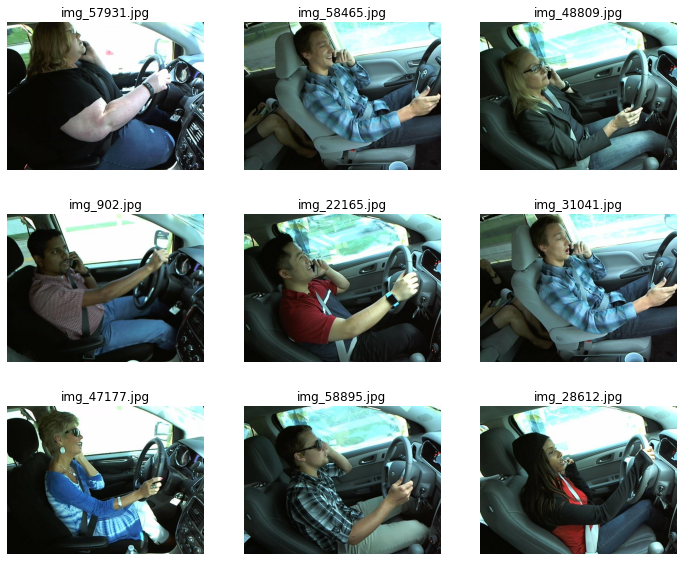

				# c5 : operating the radio


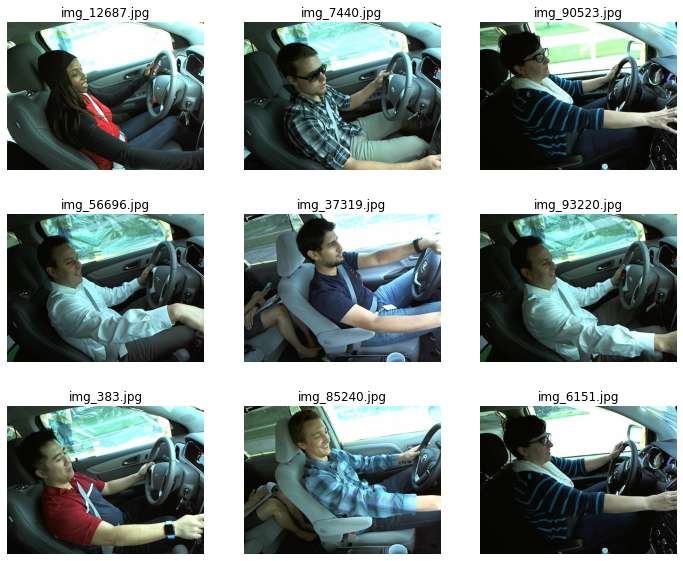

				# c6 : drinking


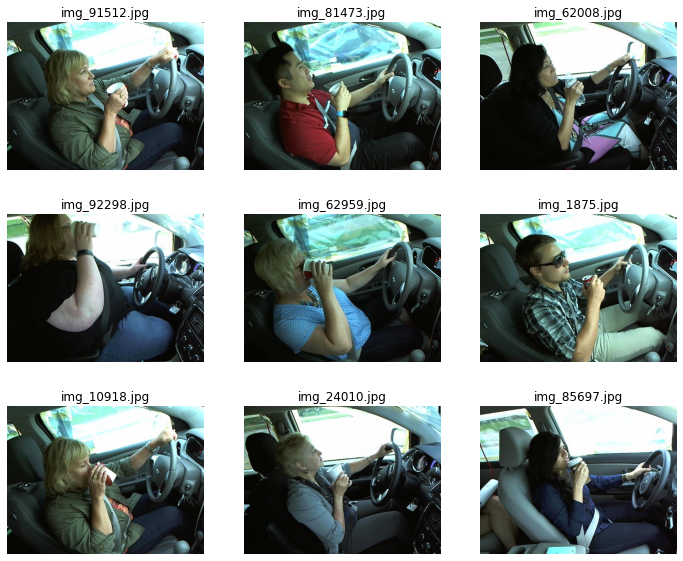

				# c7 : reaching behind


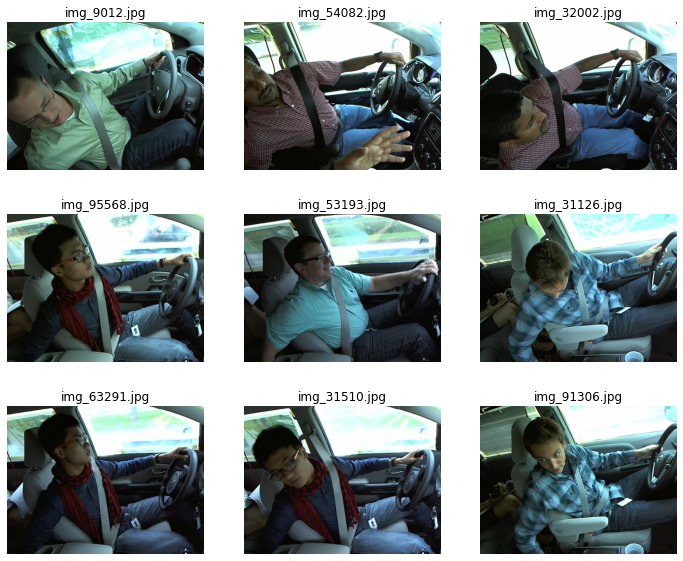

				# c8 : hair and makeup


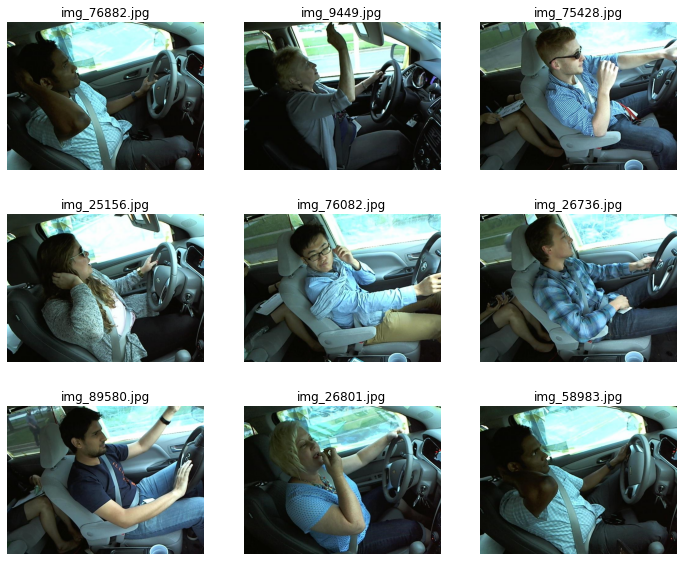

				# c9 : talking to passenger


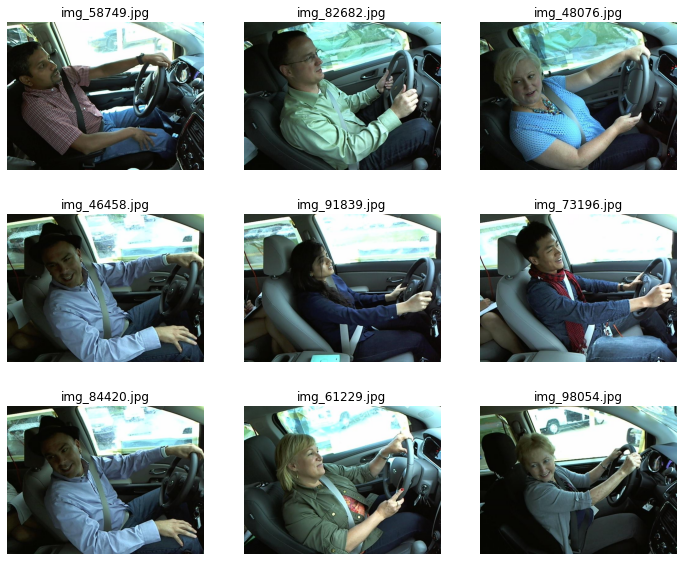

In [262]:
random.seed(30)

for label in labels:
    f, ax = plt.subplots(figsize=(12, 10))
    files = glob('{}/train/{}/*.jpg'.format(data_dir, label))

    # 총 9개의 이미지를 시각화한다
    print('\t\t\t\t# {} : {}'.format(label, labels_text[label]))
    for x in range(9):
        rand = random.randint(0,len(files[:])+1)
        t = plt.subplot(3,3,  x+1)
        image = read_image(files[rand])
        plt.imshow(image)
        t.set_title(os.path.basename(files[rand]))
        plt.axis('off')
    plt.show()
   

random seed 30 50 100
c0 68246 47447 talking passenger 30
c9 img_82809 normal 유사 50
 57214 normal 유사 100
c8 95436 애매.. 100
26736 애매... 30
c9 img_82682, 91839, 73196, 61229 normal 유사 30

random으로 수회 돌려보았을때 애매하거나 틀린 outlier들이 존재하는 것을 확인 
전처리 작업이 필요 

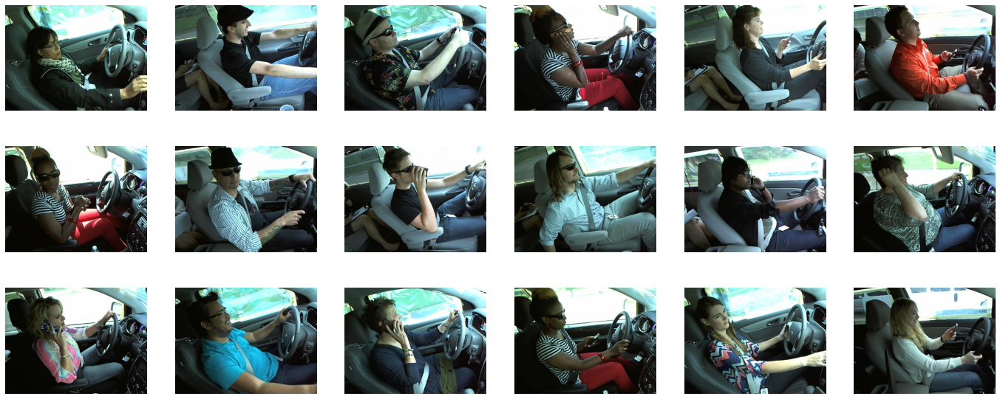

In [101]:
# 테스트 데이터 예시를 시각화한다
f, ax = plt.subplots(figsize=(24, 10))
files = glob('{}/test/*.jpg'.format(data_dir))
    
# 총 18개의 이미지를 시각화한다
for x in range(18):
    plt.subplot(3, 6, x+1)
    image = read_image(files[x])
    plt.imshow(image)
    plt.axis('off')

In [104]:
#pandas가 없어서 설치: pip install pandas

Note: you may need to restart the kernel to use updated packages.


In [111]:
#CSV파일 분석을 위해 pandas와 numpy import

import pandas as pd 
import numpy as np

In [112]:
#  제공되었던 기 라벨링 된 데이터 파일 확인

driver_list = pd.read_csv(r'C:\Users\Public\state-farm-distracted-driver-detection\driver_imgs_list.csv')
driver_list.head()

,subject,classname,img
0,p002,c0,img_44733.jpg
1,p002,c0,img_72999.jpg
2,p002,c0,img_25094.jpg
3,p002,c0,img_69092.jpg
4,p002,c0,img_92629.jpg


**오류 발생 사례**
>Error : unicode문자열이 존재


* 해결방법: 경로명을 원시코드로 전환 'r'(raw code)

In [116]:
np.unique(driver_list['subject']).tolist()[:5]


['p002', 'p012', 'p014', 'p015', 'p016']

In [118]:
np.unique(driver_list['subject']).tolist()[-5:]

['p064', 'p066', 'p072', 'p075', 'p081']

In [113]:
# 운전자 ID 고유값(subjec)의 개수를 출력한다
# numpy.unique(array, return_index=False, return_inverse=False, return_counts=False, axis=None)
# : Find the unique elements of an array.

len(np.unique(driver_list['subject']).tolist())

26

In [132]:
#pandas.iterrows()는 각 행에 접근하면서 index도 함께 반환한다.
#pandas에서 for문을 사용할때 iterrows를 함께 사용하면 series 클래스로 반환한다. 
for i, row in driver_list.iterrows():
    if(i > 4):
        break
    else:
        print(i)
        print(row)
        print(type(row))

0
subject               p002
classname               c0
img          img_44733.jpg
Name: 0, dtype: object
<class 'pandas.core.series.Series'>
1
subject               p002
classname               c0
img          img_72999.jpg
Name: 1, dtype: object
<class 'pandas.core.series.Series'>
2
subject               p002
classname               c0
img          img_25094.jpg
Name: 2, dtype: object
<class 'pandas.core.series.Series'>
3
subject               p002
classname               c0
img          img_69092.jpg
Name: 3, dtype: object
<class 'pandas.core.series.Series'>
4
subject               p002
classname               c0
img          img_92629.jpg
Name: 4, dtype: object
<class 'pandas.core.series.Series'>


In [189]:
#csv 형태: subjec, classname, img
#이미지name을 운전자 별로 저장
driver_img={}
for i, row in driver_list.iterrows(): #list형태로 저장됨
    driver = row['subject']
    label = row['classname']
    image = row['img']
    #만약 해당하는 드라이버의 ID key값이 없으면, None을 반환(get의 성질, =false)
    #해당 ID를 새로운 key값으로 해서 value(image)를 저장
    if not driver_img.get(driver, False):
        driver_img[driver] =[image] #list형으로 저장해 준다.
    #아니라면 해당 드라이버 ID key값 리스트에 image파일을 추가로 저장
    else:
        driver_img.get(driver).append(image) #str형태는 append가 불가!
    

**오류 발생 사례**
>if not을 안 쓰고 if True로 하면 한 번 밖에 동작하지 않는다. 


* 해결방법: 

In [191]:
driver_img['p002']

['img_44733.jpg',
 'img_72999.jpg',
 'img_25094.jpg',
 'img_69092.jpg',
 'img_92629.jpg',
 'img_3370.jpg',
 'img_67639.jpg',
 'img_58560.jpg',
 'img_35779.jpg',
 'img_10012.jpg',
 'img_70354.jpg',
 'img_54617.jpg',
 'img_26684.jpg',
 'img_82409.jpg',
 'img_5585.jpg',
 'img_19029.jpg',
 'img_40930.jpg',
 'img_31547.jpg',
 'img_87373.jpg',
 'img_10627.jpg',
 'img_66355.jpg',
 'img_97714.jpg',
 'img_37344.jpg',
 'img_54848.jpg',
 'img_59964.jpg',
 'img_70675.jpg',
 'img_43317.jpg',
 'img_13585.jpg',
 'img_63064.jpg',
 'img_91058.jpg',
 'img_79799.jpg',
 'img_18198.jpg',
 'img_55108.jpg',
 'img_87789.jpg',
 'img_11582.jpg',
 'img_24152.jpg',
 'img_28404.jpg',
 'img_8868.jpg',
 'img_14949.jpg',
 'img_41276.jpg',
 'img_70611.jpg',
 'img_42895.jpg',
 'img_87995.jpg',
 'img_40990.jpg',
 'img_68866.jpg',
 'img_71265.jpg',
 'img_90102.jpg',
 'img_30954.jpg',
 'img_3570.jpg',
 'img_59000.jpg',
 'img_48323.jpg',
 'img_13073.jpg',
 'img_80662.jpg',
 'img_57625.jpg',
 'img_39046.jpg',
 'img_89021.jp

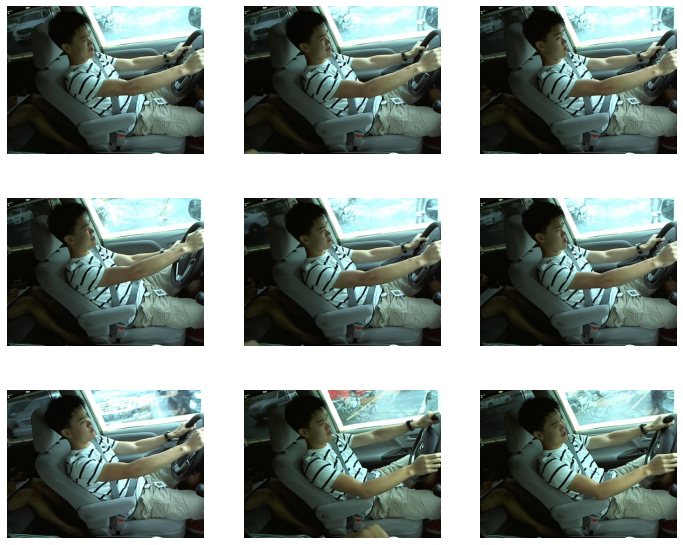

				# 운전자 : p002 | 클래스 : "c0 : normal driving"


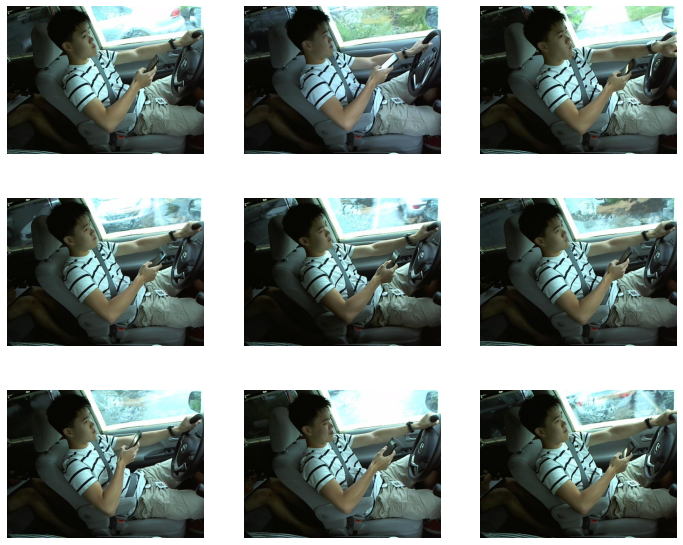

				# 운전자 : p002 | 클래스 : "c1 : texting - right"


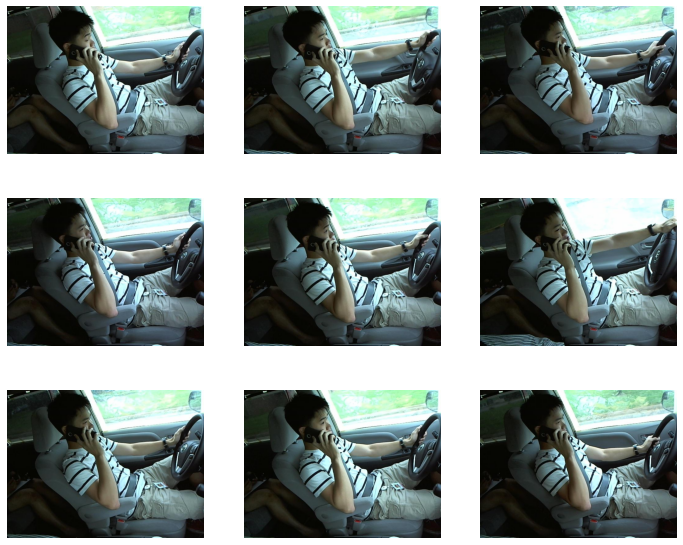

				# 운전자 : p002 | 클래스 : "c2 : talking on the phone - right"


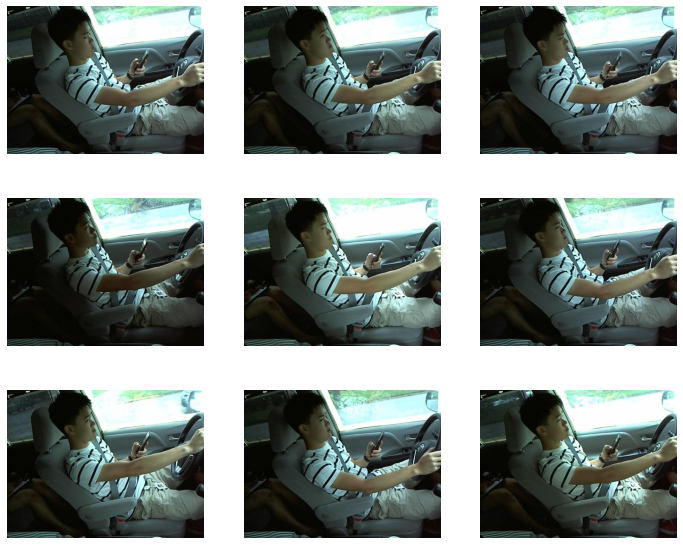

				# 운전자 : p002 | 클래스 : "c3 : texting - left"


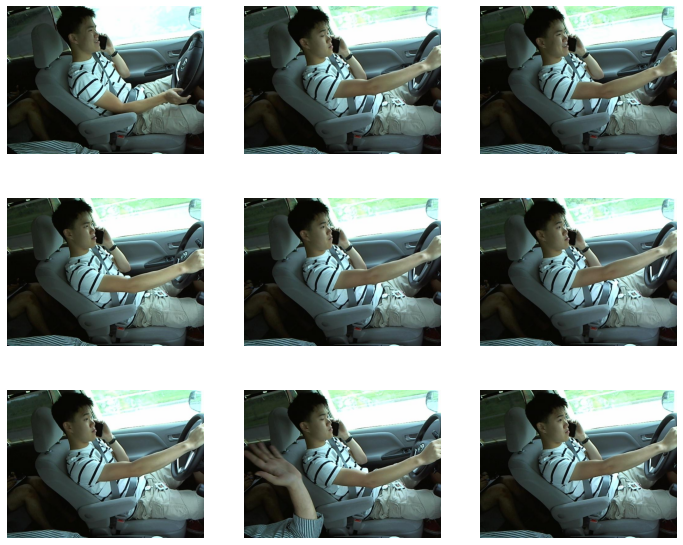

				# 운전자 : p002 | 클래스 : "c4 : talking on the phone - left"


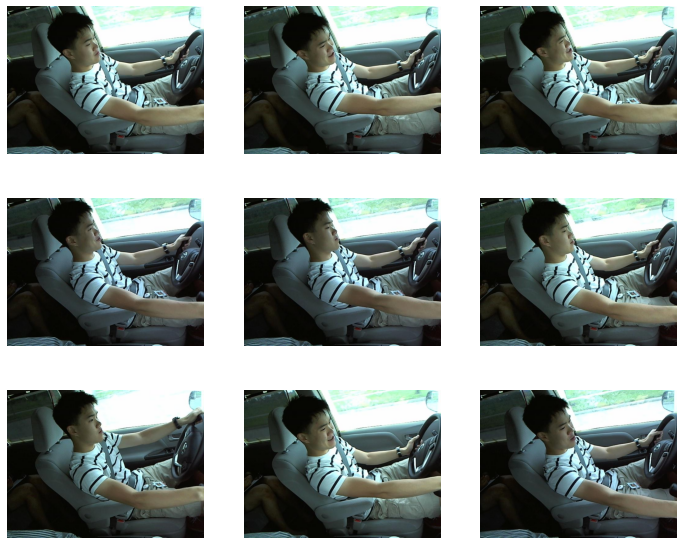

				# 운전자 : p002 | 클래스 : "c5 : operating the radio"


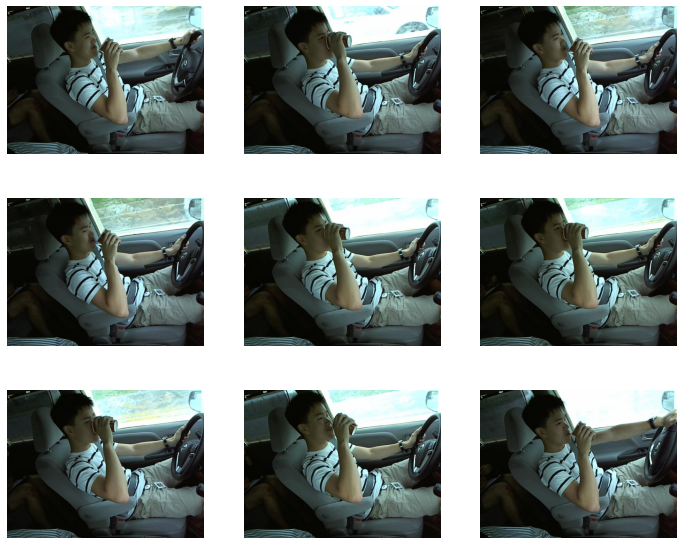

				# 운전자 : p002 | 클래스 : "c6 : drinking"


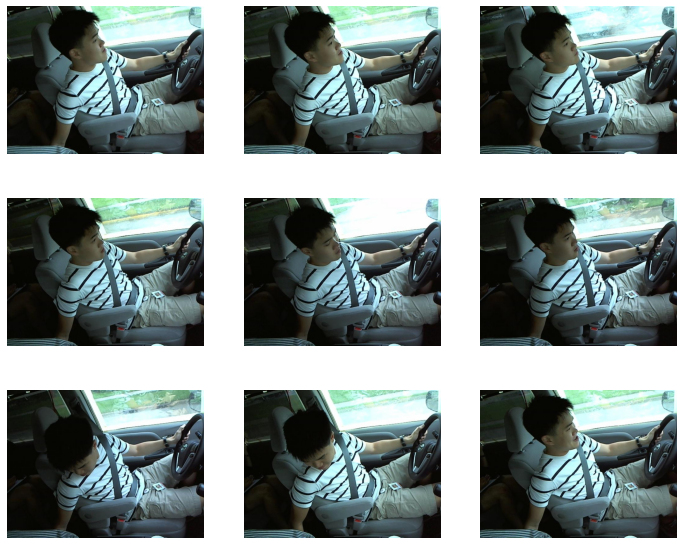

				# 운전자 : p002 | 클래스 : "c7 : reaching behind"


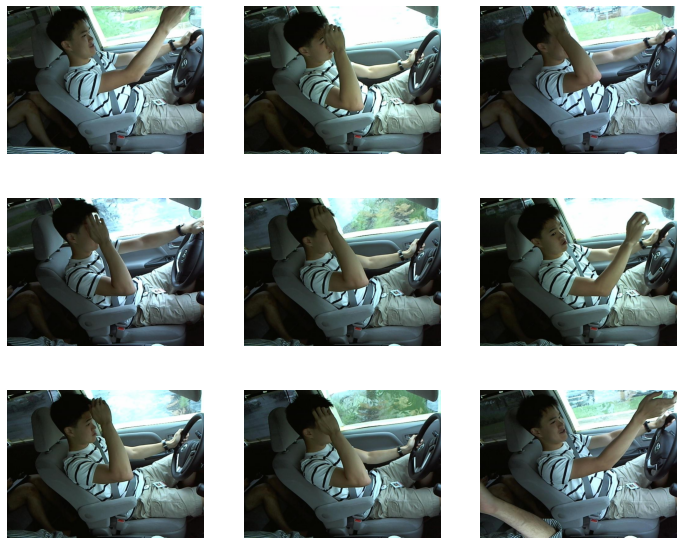

				# 운전자 : p002 | 클래스 : "c8 : hair and makeup"


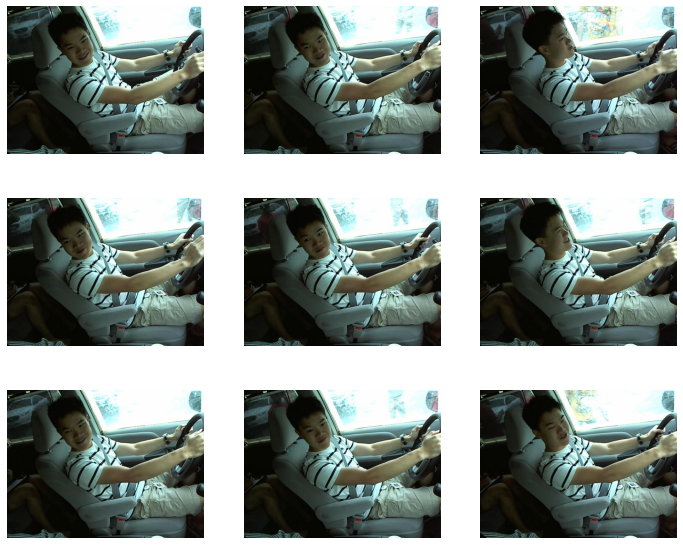

				# 운전자 : p002 | 클래스 : "c9 : talking to passenger"


In [196]:
# 운전자별 훈련 데이터 예시를 시각화한다
for driver in np.unique(driver_list['subject']).tolist():
    for label in labels:
        f, ax = plt.subplots(figsize=(12, 10))
        files = glob('{}/train/{}/*.jpg'.format(data_dir, label))
        print_files = []
        for fl in files:
            if (driver_list[driver_list['img'] == os.path.basename(fl)]['subject'] == driver).values[0]:
                print_files.append(fl)
    
        # 총 9개의 이미지를 시각화한다
        for x in range(9):
            plt.subplot(3, 3, x+1)
            image = read_image(print_files[x])
            plt.imshow(image)
            plt.axis('off')
        plt.show()
        
        # 운전자 ID와 클래스를 출력한다
        print('\t\t\t\t# 운전자 : {} | 클래스 : "{} : {}"'.format(driver, label, labels_text[label]))
        
    # 운전자 1명에 대해서만 시각화한다.
    break

# "c0 : 안전 운전" Outliers


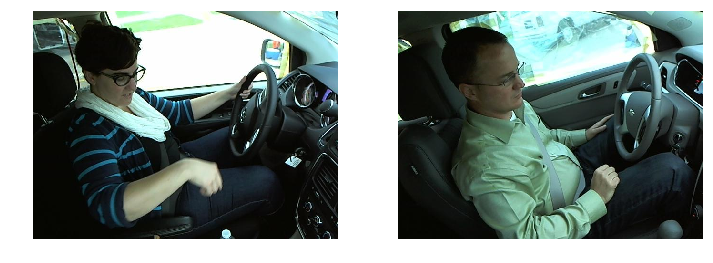

# "c3: 왼손으로 문자" Outliers


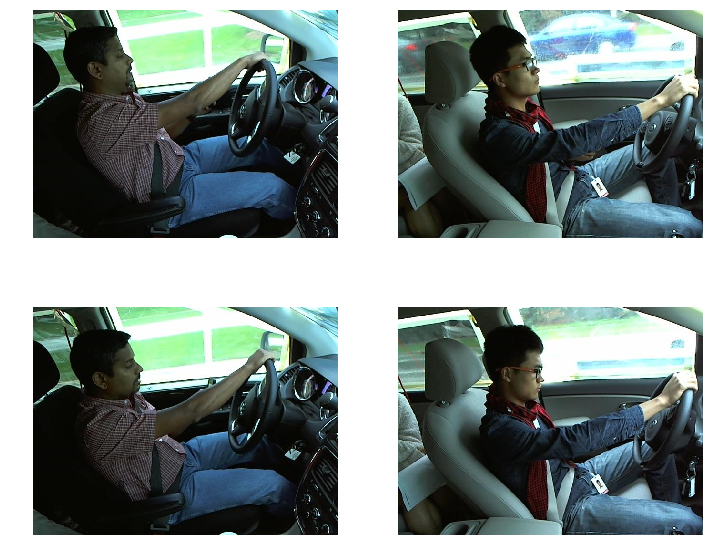

# "c4: 왼손으로 전화" Outliers


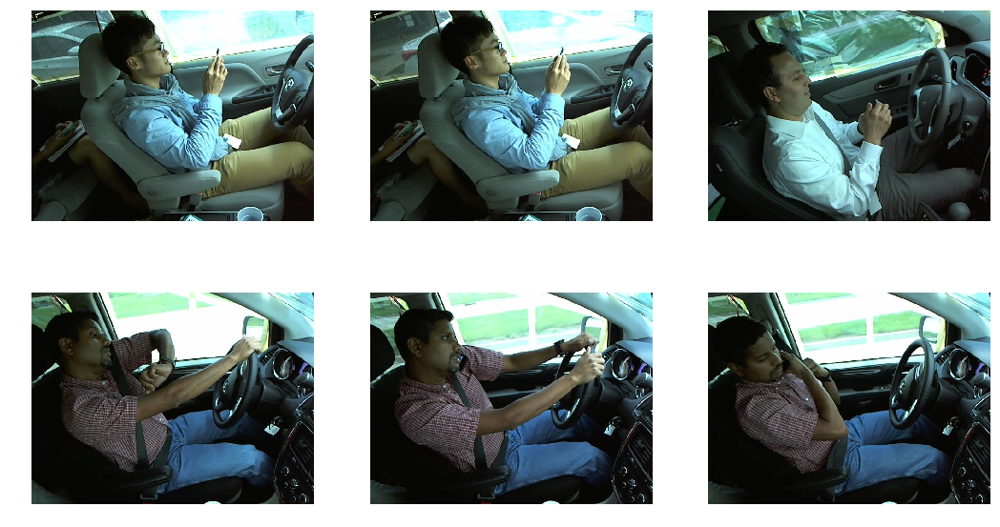

# "c9: 조수석과 대화" Outliers


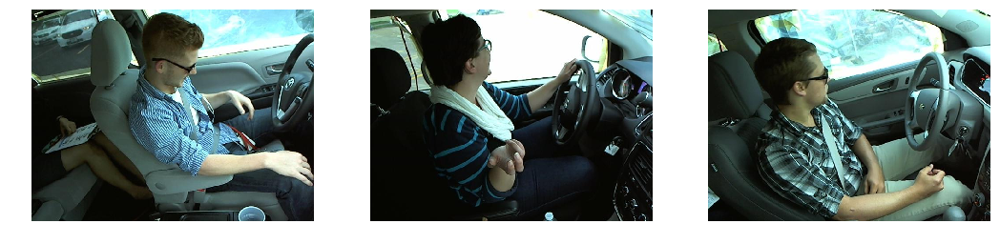

In [10]:
# 훈련 데이터 중 특이한 데이터를 시각화한다

# Label : c0 안전 운전
label = 'c0'
imgs = [21155, 31121]
print('# "c0 : 안전 운전" Outliers')
f, ax = plt.subplots(figsize=(12, 10))
for x in range(len(imgs)):
    plt.subplot(1, 2, x+1)
    image = read_image('{}train/{}/img_{}.jpg'.format(data_dir, label, imgs[x]))
    plt.imshow(image)
    plt.axis('off')
plt.show()


# Label : c3 왼손으로 문자
label = 'c3'
imgs = [38563, 45874, 49269, 62784]
print('# "c3: 왼손으로 문자" Outliers')
f, ax = plt.subplots(figsize=(12, 10))
for x in range(len(imgs)):
    plt.subplot(2, 2, x+1)
    image = read_image('{}train/{}/img_{}.jpg'.format(data_dir, label, imgs[x]))
    plt.imshow(image)
    plt.axis('off')
plt.show()


# Label : c4 왼손으로 전화
label = 'c4'
imgs = [92769, 38427, 41743, 69998, 77347, 16077]
print('# "c4: 왼손으로 전화" Outliers')
f, ax = plt.subplots(figsize=(18, 10))
for x in range(len(imgs)):
    plt.subplot(2, 3, x+1)
    image = read_image('{}train/{}/img_{}.jpg'.format(data_dir, label, imgs[x]))
    plt.imshow(image)
    plt.axis('off')
plt.show()


# Label : c9 조수석과 대화
label = 'c9'
imgs = [28068, 37708, 73663]
print('# "c9: 조수석과 대화" Outliers')
f, ax = plt.subplots(figsize=(18, 10))
for x in range(len(imgs)):
    plt.subplot(1, 3, x+1)
    image = read_image('{}train/{}/img_{}.jpg'.format(data_dir, label, imgs[x]))
    plt.imshow(image)
    plt.axis('off')
plt.show()
